<a href="https://colab.research.google.com/github/faopazo/DM_CyT/blob/Ayelen/pretp1_cyt.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Data Mining en Ciencia y Tecnología: Preentrega TP1

**Abrir los archivos .TXT. Visualizar las series temporales para cada canal.**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# We'll need to update our path to import from Drive.
import sys
sys.path.append('/content/drive/MyDrive/procesados')

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pylab as plt 
import matplotlib.gridspec as gridspec
from scipy.signal import butter, lfilter
from sklearn import decomposition

In [ ]:
!pip install mne
import mne

In [ ]:
# Montage 10-20
mont1020 = mne.channels.make_standard_montage('standard_1020')
# Elijo canales que tengo
kept_channels = ['Fp1', 'Fp2', 'F3', 'F4', 'C3', 'C4', 'P3', 'P4', 'O1', 'O2', 'F7', 'F8', 
                 'T7', 'T8', 'P7', 'P8', 'Fz', 'Cz', 'Pz', 'FC1', 'FC2',
                 'FC5', 'FC6','CP1','CP2','CP5','CP6','AFz','Fpz','POz']

ind = [i for (i, channel) in enumerate(mont1020.ch_names) if channel in kept_channels]
mont1020_30 = mont1020.copy()
# Me quedo solo con los canales seleccionados
mont1020_30.ch_names = [mont1020.ch_names[x] for x in ind]
kept_channel_info = [mont1020.dig[x+3] for x in ind]
# Me quedo con las referencias desde dónde están ubicados los canales
mont1020_30.dig = mont1020.dig[0:3]+kept_channel_info
info_eeg = mne.create_info(ch_names=mont1020_30.ch_names, sfreq=128,
                            ch_types='eeg').set_montage(mont1020_30)

Sampling rate: 128.00 Hz
Data shape: 7681 samples x 30 channels
Tiempo total : 60.01 


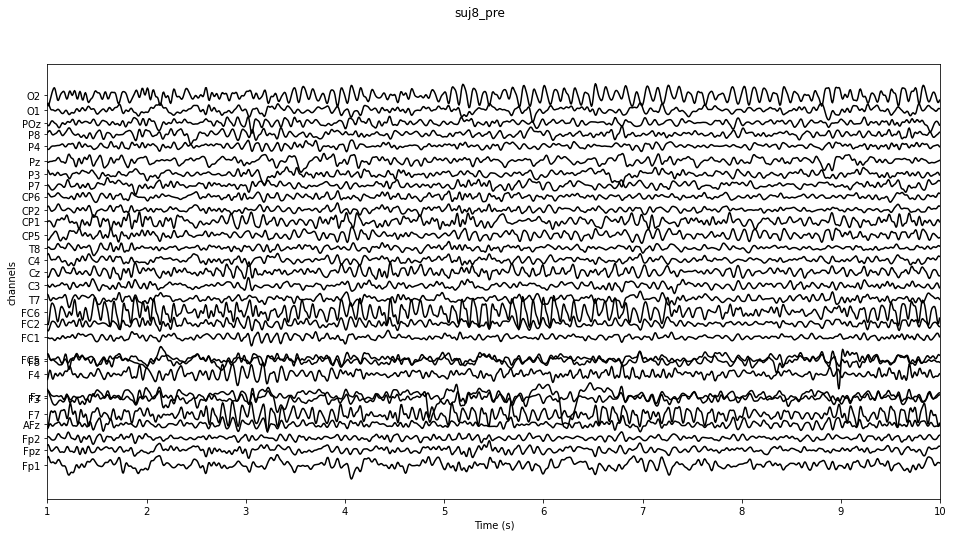

Sampling rate: 128.00 Hz
Data shape: 7681 samples x 30 channels
Tiempo total : 60.01 


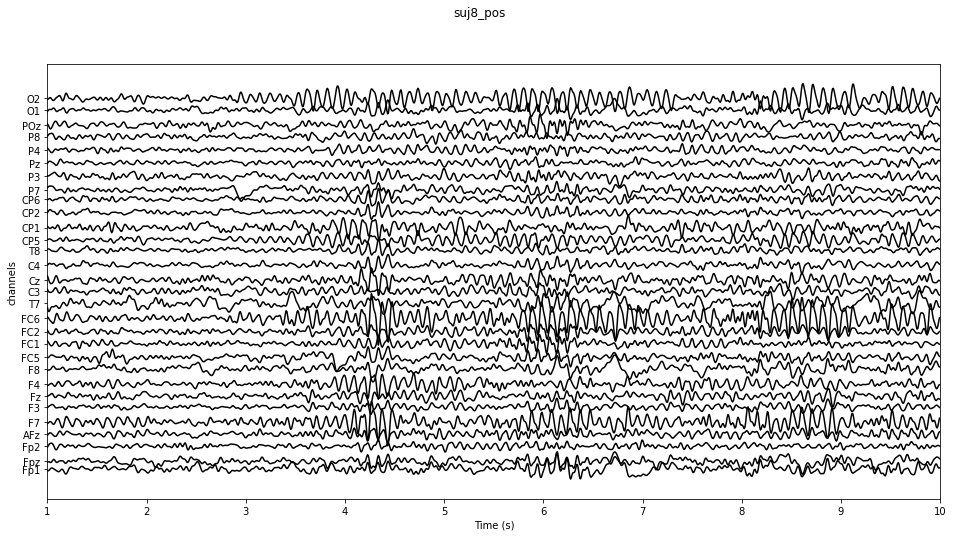

Sampling rate: 128.00 Hz
Data shape: 7681 samples x 30 channels
Tiempo total : 60.01 


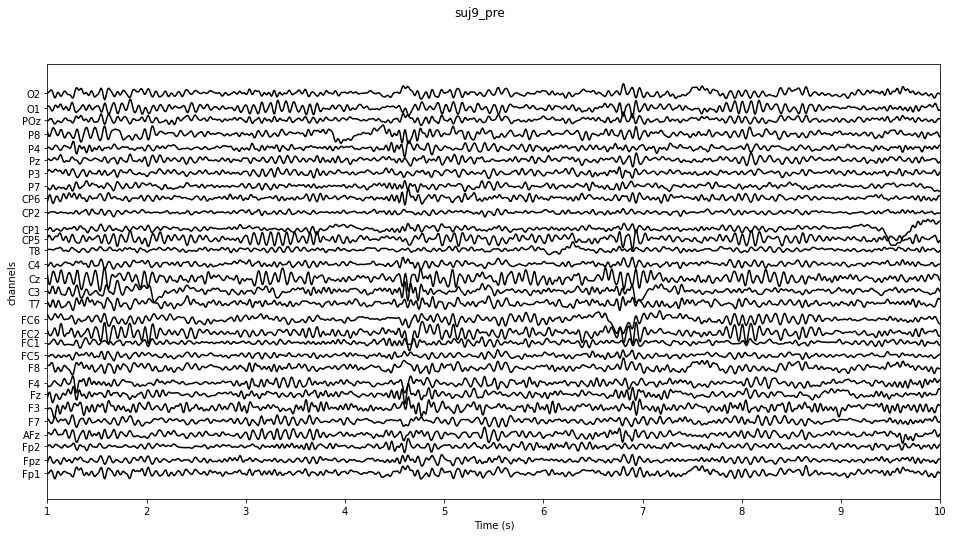

Sampling rate: 128.00 Hz
Data shape: 7681 samples x 30 channels
Tiempo total : 60.01 


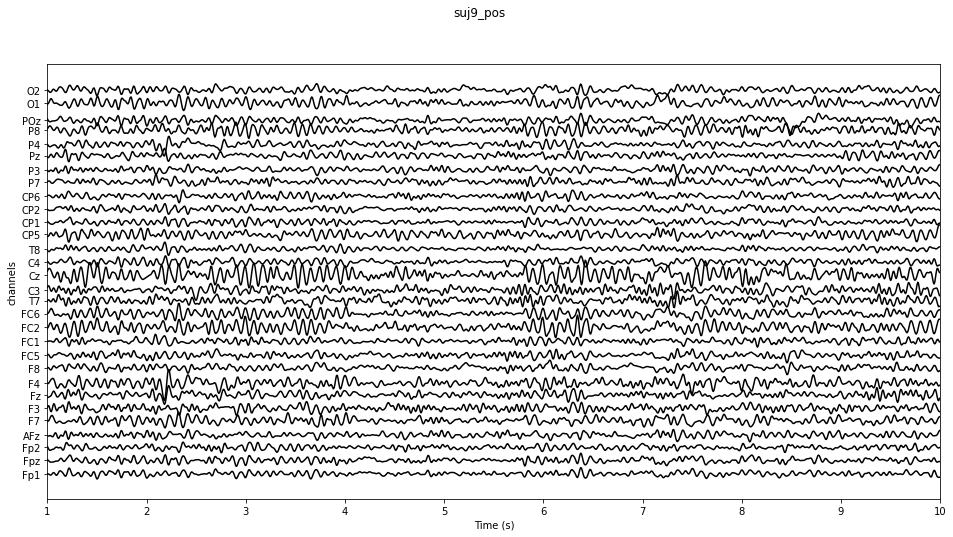

Sampling rate: 128.00 Hz
Data shape: 7681 samples x 30 channels
Tiempo total : 60.01 


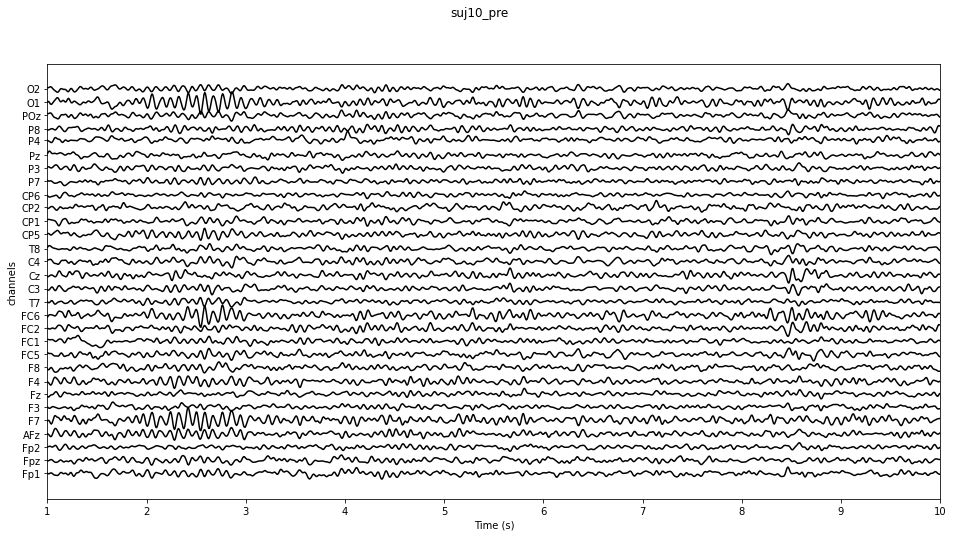

Sampling rate: 128.00 Hz
Data shape: 7681 samples x 30 channels
Tiempo total : 60.01 


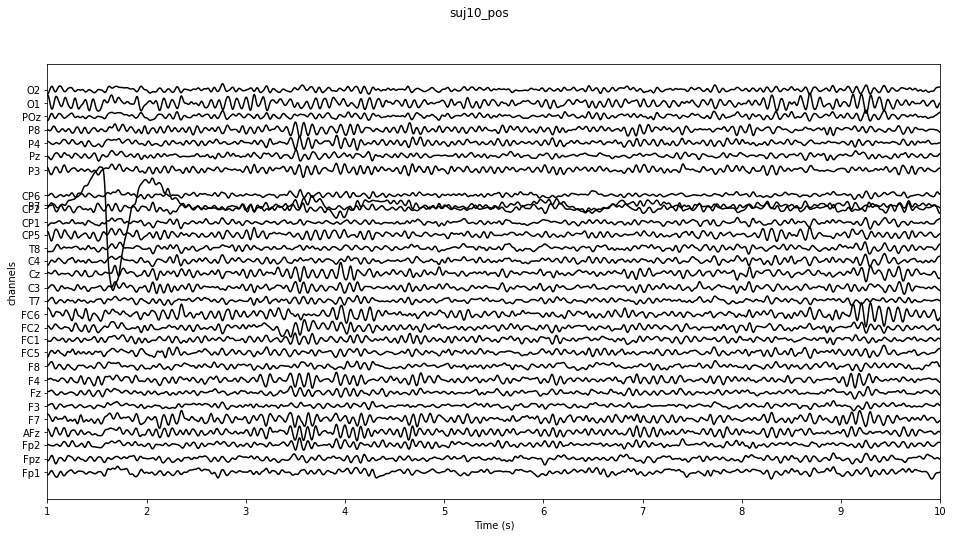

Sampling rate: 128.00 Hz
Data shape: 7681 samples x 30 channels
Tiempo total : 60.01 


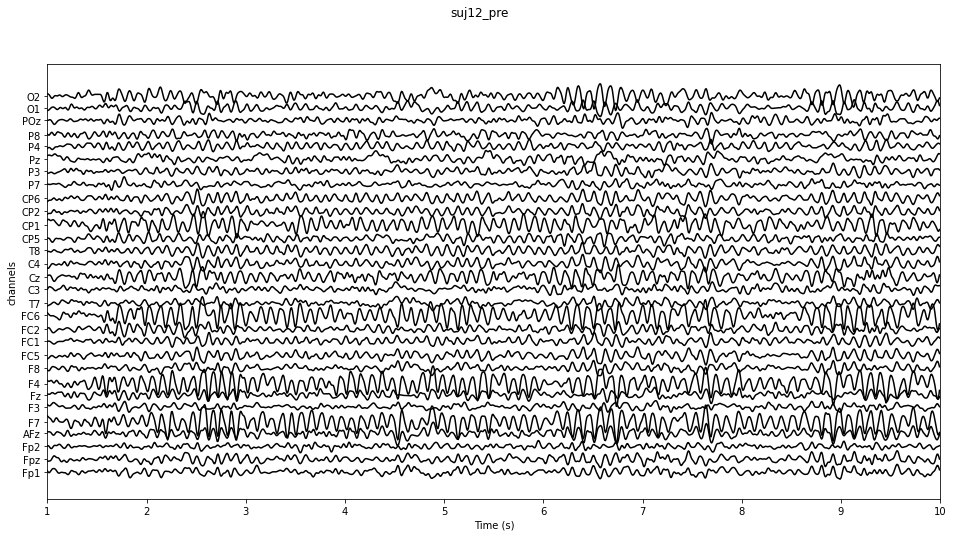

Sampling rate: 128.00 Hz
Data shape: 7681 samples x 30 channels
Tiempo total : 60.01 


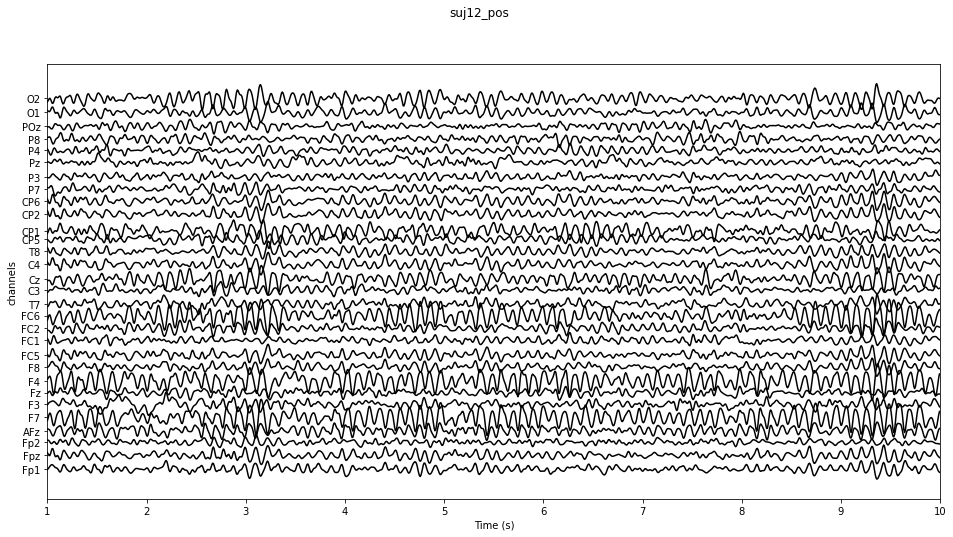

Sampling rate: 128.00 Hz
Data shape: 7681 samples x 30 channels
Tiempo total : 60.01 


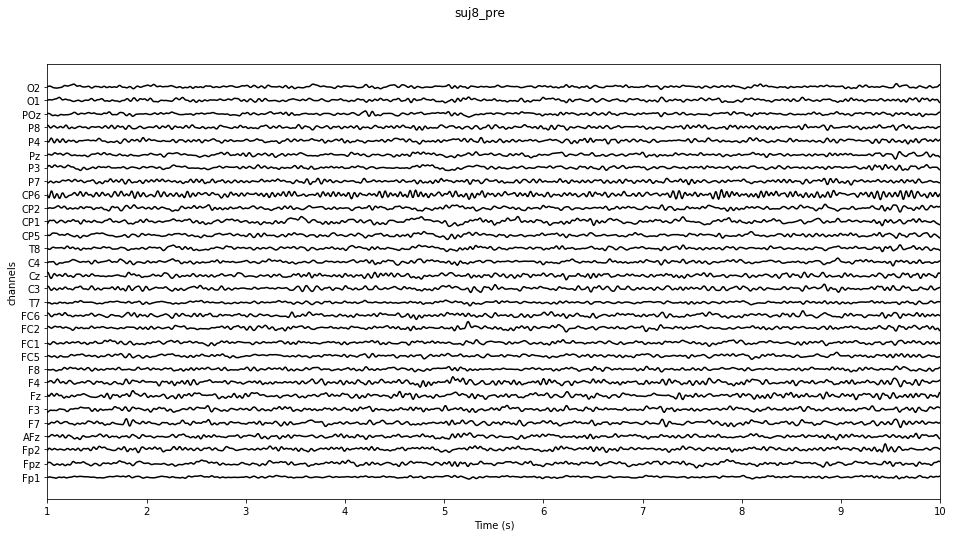

Sampling rate: 128.00 Hz
Data shape: 7681 samples x 30 channels
Tiempo total : 60.01 


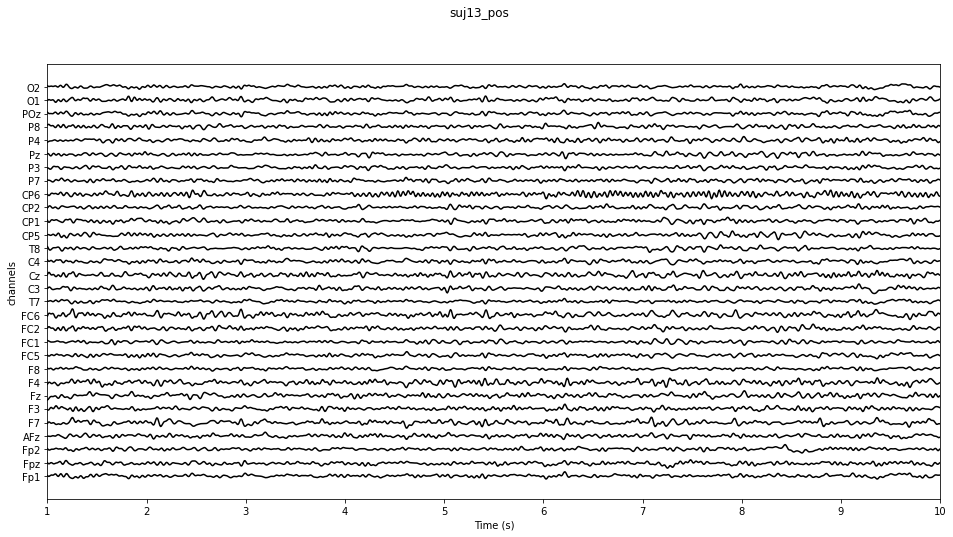

In [ ]:
filename = '/content/drive/MyDrive/procesados/suj_8_bl_1.txt'
suj8_pre = pd.read_csv(filename, sep=',', header=None)
suj8_pre = suj8_pre.to_numpy()
srate=128
ch    = suj8_pre.shape[0]
samples = suj8_pre.shape[1] 

print("Sampling rate: {:.2f} Hz".format(srate))
print("Data shape: {:d} samples x {:d} channels".format(suj8_pre.shape[1], suj8_pre.shape[0]))
print("Tiempo total : {:.2f} ".format(samples/srate))

inicio = 1
fin    = 10
xticks = np.arange(inicio*srate,(fin+1)*srate,srate)
fig,ax = plt.subplots(ncols=1,figsize=(16,8))
fig.suptitle('suj8_pre')
yticks=[]
for c in np.arange(ch):
    temp = suj8_pre[c,inicio*srate:fin*srate]
    dmin=np.min(temp)
    dmax=np.max(temp)
    vmedio = np.mean([dmin,dmax])+30*c
    yticks.append(vmedio)
    ax.plot(np.arange(inicio*srate,fin*srate),vmedio*np.ones_like(temp)+temp,'k')
ax.set_xlim([inicio*srate,fin*srate])
ax.set_xticks(xticks)
ax.set_xticklabels(np.arange(inicio,fin+1))
ax.set_yticks(yticks)
ax.set_yticklabels(mont1020_30.ch_names)
ax.set_ylabel('channels')
ax.set_xlabel('Time (s)')
  
plt.show()


filename = '/content/drive/MyDrive/procesados/suj_8_bl_2.txt'
suj8_pos = pd.read_csv(filename, sep=',', header=None)
suj8_pos = suj8_pos.to_numpy()
srate=128
ch    = suj8_pos.shape[0]
samples = suj8_pos.shape[1] 

print("Sampling rate: {:.2f} Hz".format(srate))
print("Data shape: {:d} samples x {:d} channels".format(suj8_pos.shape[1], suj8_pos.shape[0]))
print("Tiempo total : {:.2f} ".format(samples/srate))

inicio = 1
fin    = 10
xticks = np.arange(inicio*srate,(fin+1)*srate,srate)
fig,ax = plt.subplots(ncols=1,figsize=(16,8))
fig.suptitle('suj8_pos')
yticks=[]
for c in np.arange(ch):
    temp = suj8_pos[c,inicio*srate:fin*srate]
    dmin=np.min(temp)
    dmax=np.max(temp)
    vmedio = np.mean([dmin,dmax])+30*c
    yticks.append(vmedio)
    ax.plot(np.arange(inicio*srate,fin*srate),vmedio*np.ones_like(temp)+temp,'k')
ax.set_xlim([inicio*srate,fin*srate])
ax.set_xticks(xticks)
ax.set_xticklabels(np.arange(inicio,fin+1))
ax.set_yticks(yticks)
ax.set_yticklabels(mont1020_30.ch_names)
ax.set_ylabel('channels')
ax.set_xlabel('Time (s)')
  
plt.show()


filename = '/content/drive/MyDrive/procesados/suj_9_bl_1.txt'
suj9_pre = pd.read_csv(filename, sep=',', header=None)
suj9_pre = suj9_pre.to_numpy()
srate=128
ch    = suj9_pre.shape[0]
samples = suj9_pre.shape[1] 

print("Sampling rate: {:.2f} Hz".format(srate))
print("Data shape: {:d} samples x {:d} channels".format(suj9_pre.shape[1], suj9_pre.shape[0]))
print("Tiempo total : {:.2f} ".format(samples/srate))

inicio = 1
fin    = 10
xticks = np.arange(inicio*srate,(fin+1)*srate,srate)
fig,ax = plt.subplots(ncols=1,figsize=(16,8))
fig.suptitle('suj9_pre')
yticks=[]
for c in np.arange(ch):
    temp = suj9_pre[c,inicio*srate:fin*srate]
    dmin=np.min(temp)
    dmax=np.max(temp)
    vmedio = np.mean([dmin,dmax])+30*c
    yticks.append(vmedio)
    ax.plot(np.arange(inicio*srate,fin*srate),vmedio*np.ones_like(temp)+temp,'k')
ax.set_xlim([inicio*srate,fin*srate])
ax.set_xticks(xticks)
ax.set_xticklabels(np.arange(inicio,fin+1))
ax.set_yticks(yticks)
ax.set_yticklabels(mont1020_30.ch_names)
ax.set_ylabel('channels')
ax.set_xlabel('Time (s)')
  
plt.show()


filename = '/content/drive/MyDrive/procesados/suj_9_bl_2.txt'
suj9_pos = pd.read_csv(filename, sep=',', header=None)
suj9_pos = suj9_pos.to_numpy()
srate=128
ch    = suj9_pos.shape[0]
samples = suj9_pos.shape[1] 

print("Sampling rate: {:.2f} Hz".format(srate))
print("Data shape: {:d} samples x {:d} channels".format(suj9_pos.shape[1], suj9_pos.shape[0]))
print("Tiempo total : {:.2f} ".format(samples/srate))

inicio = 1
fin    = 10
xticks = np.arange(inicio*srate,(fin+1)*srate,srate)
fig,ax = plt.subplots(ncols=1,figsize=(16,8))
fig.suptitle('suj9_pos')
yticks=[]
for c in np.arange(ch):
    temp = suj9_pos[c,inicio*srate:fin*srate]
    dmin=np.min(temp)
    dmax=np.max(temp)
    vmedio = np.mean([dmin,dmax])+30*c
    yticks.append(vmedio)
    ax.plot(np.arange(inicio*srate,fin*srate),vmedio*np.ones_like(temp)+temp,'k')
ax.set_xlim([inicio*srate,fin*srate])
ax.set_xticks(xticks)
ax.set_xticklabels(np.arange(inicio,fin+1))
ax.set_yticks(yticks)
ax.set_yticklabels(mont1020_30.ch_names)
ax.set_ylabel('channels')
ax.set_xlabel('Time (s)')
  
plt.show()


filename = '/content/drive/MyDrive/procesados/suj_10_bl_1.txt'
suj10_pre = pd.read_csv(filename, sep=',', header=None)
suj10_pre = suj10_pre.to_numpy()
srate=128
ch    = suj10_pre.shape[0]
samples = suj10_pre.shape[1] 

print("Sampling rate: {:.2f} Hz".format(srate))
print("Data shape: {:d} samples x {:d} channels".format(suj10_pre.shape[1], suj10_pre.shape[0]))
print("Tiempo total : {:.2f} ".format(samples/srate))

inicio = 1
fin    = 10
xticks = np.arange(inicio*srate,(fin+1)*srate,srate)
fig,ax = plt.subplots(ncols=1,figsize=(16,8))
fig.suptitle('suj10_pre')
yticks=[]
for c in np.arange(ch):
    temp = suj10_pre[c,inicio*srate:fin*srate]
    dmin=np.min(temp)
    dmax=np.max(temp)
    vmedio = np.mean([dmin,dmax])+30*c
    yticks.append(vmedio)
    ax.plot(np.arange(inicio*srate,fin*srate),vmedio*np.ones_like(temp)+temp,'k')
ax.set_xlim([inicio*srate,fin*srate])
ax.set_xticks(xticks)
ax.set_xticklabels(np.arange(inicio,fin+1))
ax.set_yticks(yticks)
ax.set_yticklabels(mont1020_30.ch_names)
ax.set_ylabel('channels')
ax.set_xlabel('Time (s)')
  
plt.show()


filename = '/content/drive/MyDrive/procesados/suj_10_bl_2.txt'
suj10_pos = pd.read_csv(filename, sep=',', header=None)
suj10_pos = suj10_pos.to_numpy()
srate=128
ch    = suj10_pos.shape[0]
samples = suj10_pos.shape[1] 

print("Sampling rate: {:.2f} Hz".format(srate))
print("Data shape: {:d} samples x {:d} channels".format(suj10_pos.shape[1], suj10_pos.shape[0]))
print("Tiempo total : {:.2f} ".format(samples/srate))

inicio = 1
fin    = 10
xticks = np.arange(inicio*srate,(fin+1)*srate,srate)
fig,ax = plt.subplots(ncols=1,figsize=(16,8))
fig.suptitle('suj10_pos')
yticks=[]
for c in np.arange(ch):
    temp = suj10_pos[c,inicio*srate:fin*srate]
    dmin=np.min(temp)
    dmax=np.max(temp)
    vmedio = np.mean([dmin,dmax])+30*c
    yticks.append(vmedio)
    ax.plot(np.arange(inicio*srate,fin*srate),vmedio*np.ones_like(temp)+temp,'k')
ax.set_xlim([inicio*srate,fin*srate])
ax.set_xticks(xticks)
ax.set_xticklabels(np.arange(inicio,fin+1))
ax.set_yticks(yticks)
ax.set_yticklabels(mont1020_30.ch_names)
ax.set_ylabel('channels')
ax.set_xlabel('Time (s)')
  
plt.show()


filename = '/content/drive/MyDrive/procesados/suj_12_bl_1.txt'
suj12_pre = pd.read_csv(filename, sep=',', header=None)
suj12_pre = suj12_pre.to_numpy()
srate=128
ch    = suj12_pre.shape[0]
samples = suj12_pre.shape[1] 

print("Sampling rate: {:.2f} Hz".format(srate))
print("Data shape: {:d} samples x {:d} channels".format(suj12_pre.shape[1], suj12_pre.shape[0]))
print("Tiempo total : {:.2f} ".format(samples/srate))

inicio = 1
fin    = 10
xticks = np.arange(inicio*srate,(fin+1)*srate,srate)
fig,ax = plt.subplots(ncols=1,figsize=(16,8))
fig.suptitle('suj12_pre')
yticks=[]
for c in np.arange(ch):
    temp = suj12_pre[c,inicio*srate:fin*srate]
    dmin=np.min(temp)
    dmax=np.max(temp)
    vmedio = np.mean([dmin,dmax])+30*c
    yticks.append(vmedio)
    ax.plot(np.arange(inicio*srate,fin*srate),vmedio*np.ones_like(temp)+temp,'k')
ax.set_xlim([inicio*srate,fin*srate])
ax.set_xticks(xticks)
ax.set_xticklabels(np.arange(inicio,fin+1))
ax.set_yticks(yticks)
ax.set_yticklabels(mont1020_30.ch_names)
ax.set_ylabel('channels')
ax.set_xlabel('Time (s)')
  
plt.show()


filename = '/content/drive/MyDrive/procesados/suj_12_bl_2.txt'
suj12_pos = pd.read_csv(filename, sep=',', header=None)
suj12_pos = suj12_pos.to_numpy()
srate=128
ch    = suj12_pos.shape[0]
samples = suj12_pos.shape[1] 

print("Sampling rate: {:.2f} Hz".format(srate))
print("Data shape: {:d} samples x {:d} channels".format(suj12_pos.shape[1], suj12_pos.shape[0]))
print("Tiempo total : {:.2f} ".format(samples/srate))

inicio = 1
fin    = 10
xticks = np.arange(inicio*srate,(fin+1)*srate,srate)
fig,ax = plt.subplots(ncols=1,figsize=(16,8))
fig.suptitle('suj12_pos')
yticks=[]
for c in np.arange(ch):
    temp = suj12_pos[c,inicio*srate:fin*srate]
    dmin=np.min(temp)
    dmax=np.max(temp)
    vmedio = np.mean([dmin,dmax])+30*c
    yticks.append(vmedio)
    ax.plot(np.arange(inicio*srate,fin*srate),vmedio*np.ones_like(temp)+temp,'k')
ax.set_xlim([inicio*srate,fin*srate])
ax.set_xticks(xticks)
ax.set_xticklabels(np.arange(inicio,fin+1))
ax.set_yticks(yticks)
ax.set_yticklabels(mont1020_30.ch_names)
ax.set_ylabel('channels')
ax.set_xlabel('Time (s)')
  
plt.show()


filename = '/content/drive/MyDrive/procesados/suj_13_bl_1.txt'
suj13_pre = pd.read_csv(filename, sep=',', header=None)
suj13_pre = suj13_pre.to_numpy()
srate=128
ch    = suj13_pre.shape[0]
samples = suj13_pre.shape[1] 

print("Sampling rate: {:.2f} Hz".format(srate))
print("Data shape: {:d} samples x {:d} channels".format(suj13_pre.shape[1], suj13_pre.shape[0]))
print("Tiempo total : {:.2f} ".format(samples/srate))

inicio = 1
fin    = 10
xticks = np.arange(inicio*srate,(fin+1)*srate,srate)
fig,ax = plt.subplots(ncols=1,figsize=(16,8))
fig.suptitle('suj8_pre')
yticks=[]
for c in np.arange(ch):
    temp = suj13_pre[c,inicio*srate:fin*srate]
    dmin=np.min(temp)
    dmax=np.max(temp)
    vmedio = np.mean([dmin,dmax])+30*c
    yticks.append(vmedio)
    ax.plot(np.arange(inicio*srate,fin*srate),vmedio*np.ones_like(temp)+temp,'k')
ax.set_xlim([inicio*srate,fin*srate])
ax.set_xticks(xticks)
ax.set_xticklabels(np.arange(inicio,fin+1))
ax.set_yticks(yticks)
ax.set_yticklabels(mont1020_30.ch_names)
ax.set_ylabel('channels')
ax.set_xlabel('Time (s)')
  
plt.show()


filename = '/content/drive/MyDrive/procesados/suj_13_bl_2.txt'
suj13_pos = pd.read_csv(filename, sep=',', header=None)
suj13_pos = suj13_pos.to_numpy()
srate=128
ch    = suj13_pos.shape[0]
samples = suj13_pos.shape[1] 

print("Sampling rate: {:.2f} Hz".format(srate))
print("Data shape: {:d} samples x {:d} channels".format(suj13_pos.shape[1], suj13_pos.shape[0]))
print("Tiempo total : {:.2f} ".format(samples/srate))

inicio = 1
fin    = 10
xticks = np.arange(inicio*srate,(fin+1)*srate,srate)
fig,ax = plt.subplots(ncols=1,figsize=(16,8))
fig.suptitle('suj13_pos')
yticks=[]
for c in np.arange(ch):
    temp = suj13_pos[c,inicio*srate:fin*srate]
    dmin=np.min(temp)
    dmax=np.max(temp)
    vmedio = np.mean([dmin,dmax])+30*c
    yticks.append(vmedio)
    ax.plot(np.arange(inicio*srate,fin*srate),vmedio*np.ones_like(temp)+temp,'k')
ax.set_xlim([inicio*srate,fin*srate])
ax.set_xticks(xticks)
ax.set_xticklabels(np.arange(inicio,fin+1))
ax.set_yticks(yticks)
ax.set_yticklabels(mont1020_30.ch_names)
ax.set_ylabel('channels')
ax.set_xlabel('Time (s)')
  
plt.show()


#datos= pd.concat([suj8_pre, suj8_pos, suj9_pre, suj9_pos,suj10_pre, suj10_pos,suj12_pre, suj12_pos,suj13_pre, suj13_pos])

In [ ]:
def butter_bandpass(lowcut, highcut, fs, order):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='band')
    return b, a


def butter_bandpass_filter(data, lowcut, highcut, fs, order):
    b, a = butter_bandpass(lowcut, highcut, fs, order=order)
    y = lfilter(b, a, data)
    return y

In [ ]:
# Sample rate and desired cutoff frequencies (in Hz).

lowcut = 2
highcut = 20
order = 6
suj8_pre_filt = np.zeros_like(suj8_pre)
for i,temp_canal in enumerate(suj8_pre):
  suj8_pre_filt[i,:] = butter_bandpass_filter(temp_canal, lowcut, highcut, srate, order)

lowcut = 2
highcut = 20
order = 6
suj8_pos_filt = np.zeros_like(suj8_pos)
for i,temp_canal in enumerate(suj8_pos):
  suj8_pos_filt[i,:] = butter_bandpass_filter(temp_canal, lowcut, highcut, srate, order)

lowcut = 2
highcut = 20
order = 6
suj9_pre_filt = np.zeros_like(suj9_pre)
for i,temp_canal in enumerate(suj9_pre):
  suj9_pre_filt[i,:] = butter_bandpass_filter(temp_canal, lowcut, highcut, srate, order)

lowcut = 2
highcut = 20
order = 6
suj9_pos_filt = np.zeros_like(suj9_pos)
for i,temp_canal in enumerate(suj9_pos):
  suj9_pos_filt[i,:] = butter_bandpass_filter(temp_canal, lowcut, highcut, srate, order)

lowcut = 2
highcut = 20
order = 6
suj10_pre_filt = np.zeros_like(suj10_pre)
for i,temp_canal in enumerate(suj10_pre):
  suj10_pre_filt[i,:] = butter_bandpass_filter(temp_canal, lowcut, highcut, srate, order)

lowcut = 2
highcut = 20
order = 6
suj10_pos_filt = np.zeros_like(suj10_pos)
for i,temp_canal in enumerate(suj10_pos):
  suj10_pos_filt[i,:] = butter_bandpass_filter(temp_canal, lowcut, highcut, srate, order)

lowcut = 2
highcut = 20
order = 6
suj12_pre_filt = np.zeros_like(suj12_pre)
for i,temp_canal in enumerate(suj12_pre):
  suj12_pre_filt[i,:] = butter_bandpass_filter(temp_canal, lowcut, highcut, srate, order)

lowcut = 2
highcut = 20
order = 6
suj12_pos_filt = np.zeros_like(suj12_pos)
for i,temp_canal in enumerate(suj12_pos):
  suj12_pos_filt[i,:] = butter_bandpass_filter(temp_canal, lowcut, highcut, srate, order)

lowcut = 2
highcut = 20
order = 6
suj13_pre_filt = np.zeros_like(suj13_pre)
for i,temp_canal in enumerate(suj13_pre):
  suj13_pre_filt[i,:] = butter_bandpass_filter(temp_canal, lowcut, highcut, srate, order)

lowcut = 2
highcut = 20
order = 6
suj13_pos_filt = np.zeros_like(suj13_pos)
for i,temp_canal in enumerate(suj13_pos):
  suj13_pos_filt[i,:] = butter_bandpass_filter(temp_canal, lowcut, highcut, srate, order)

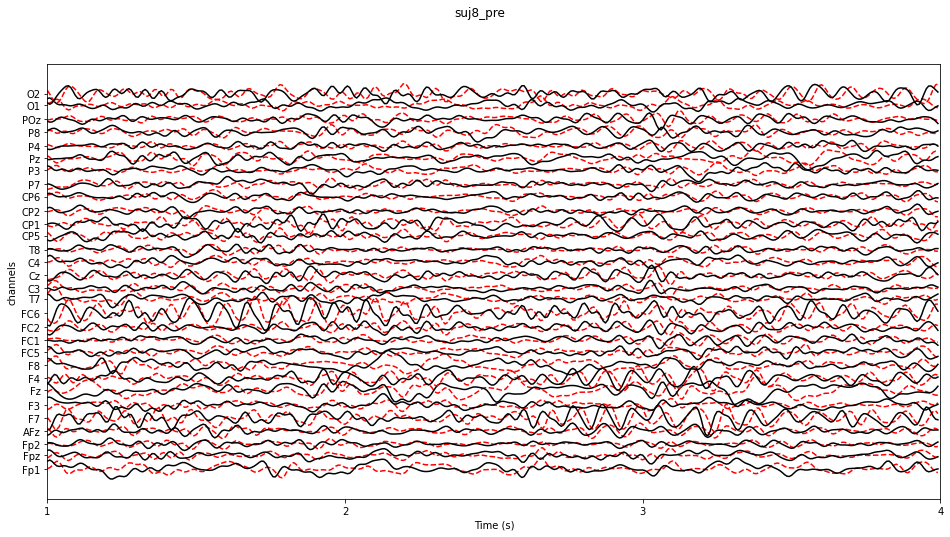

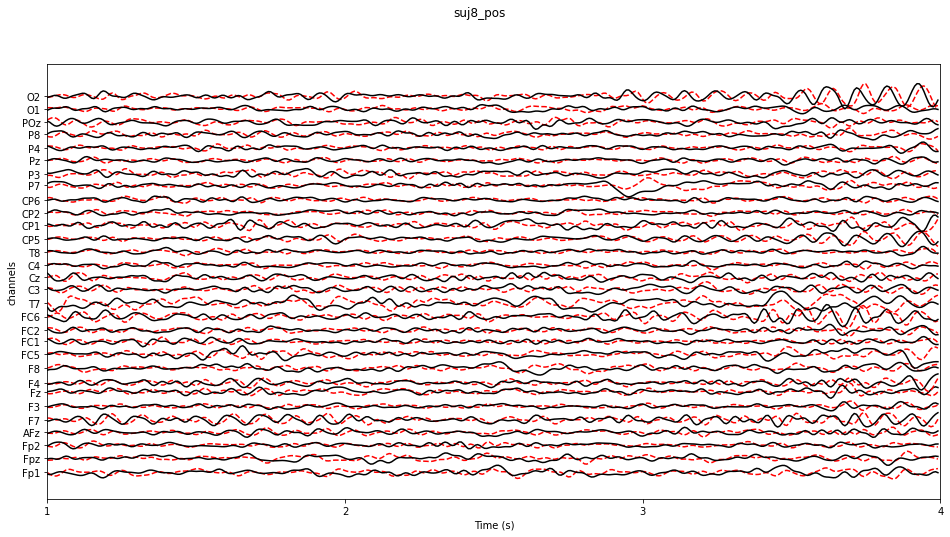

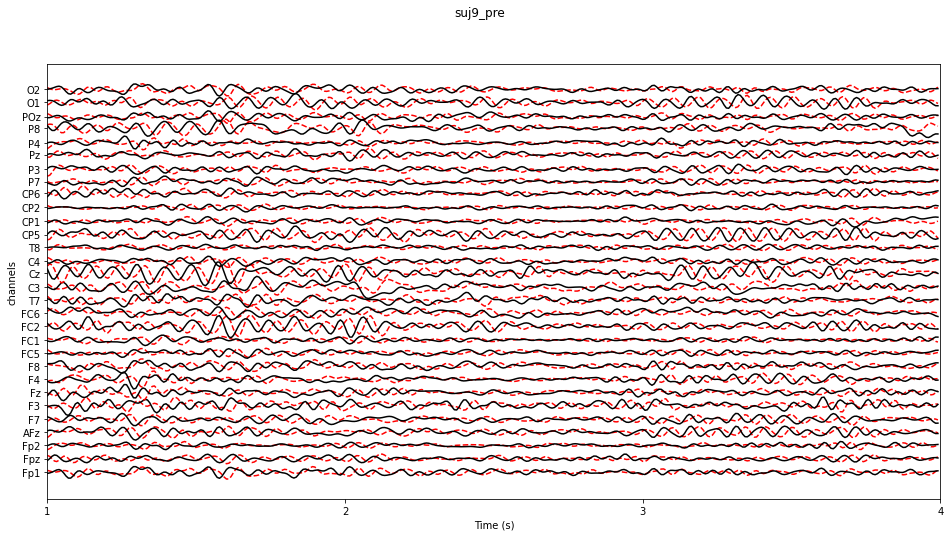

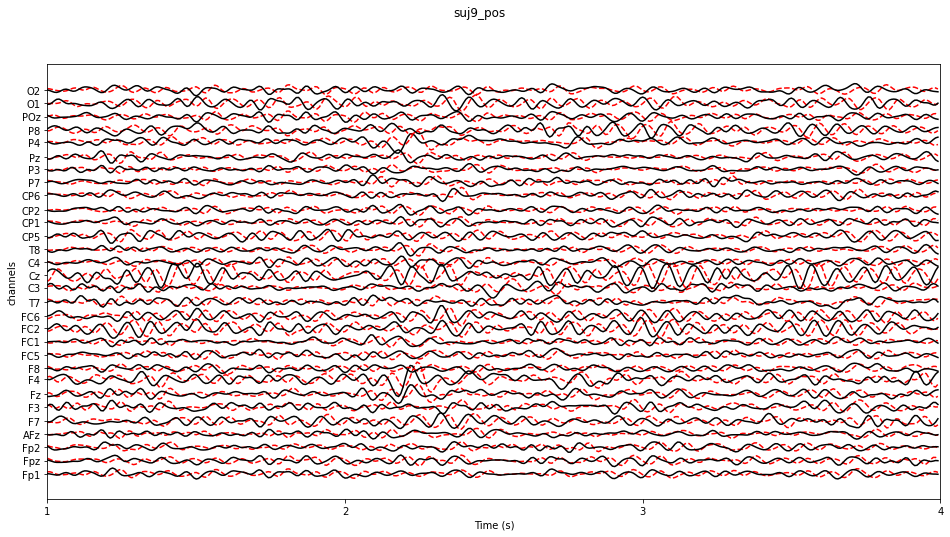

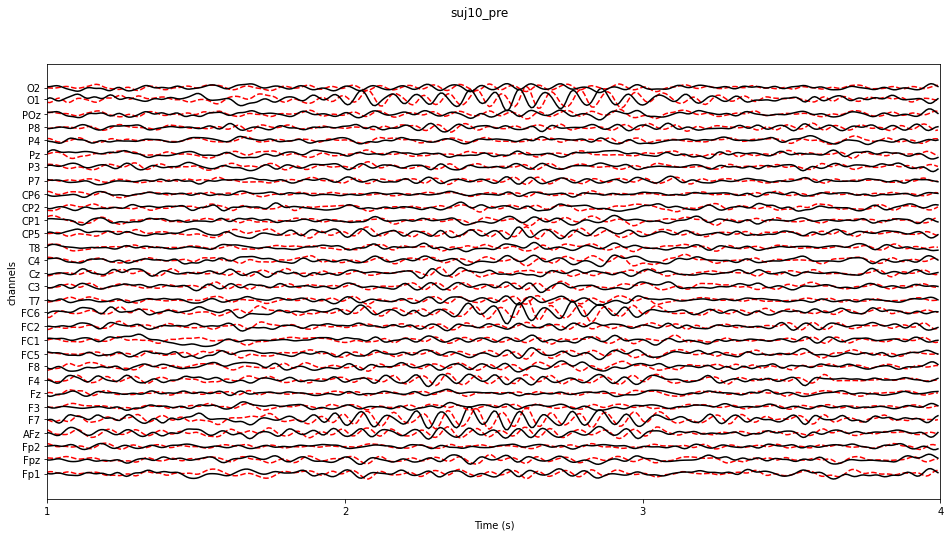

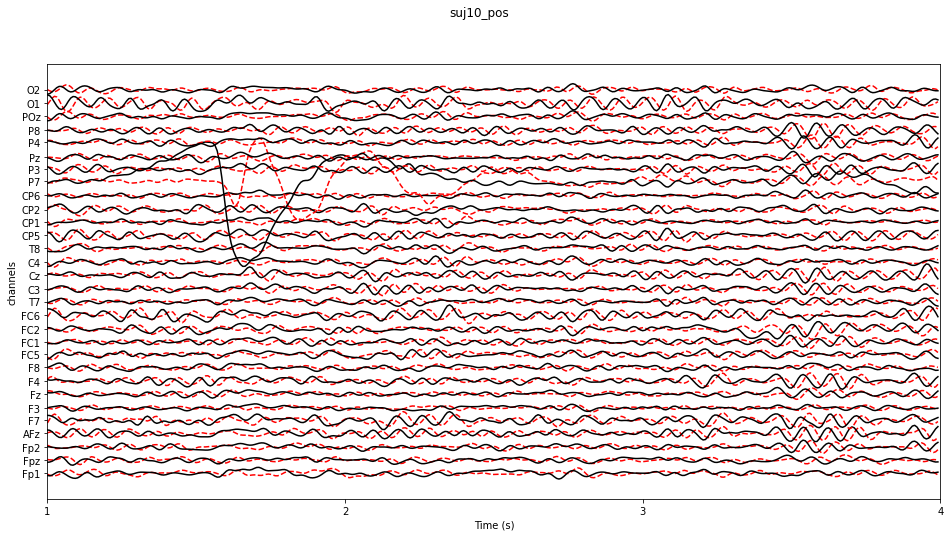

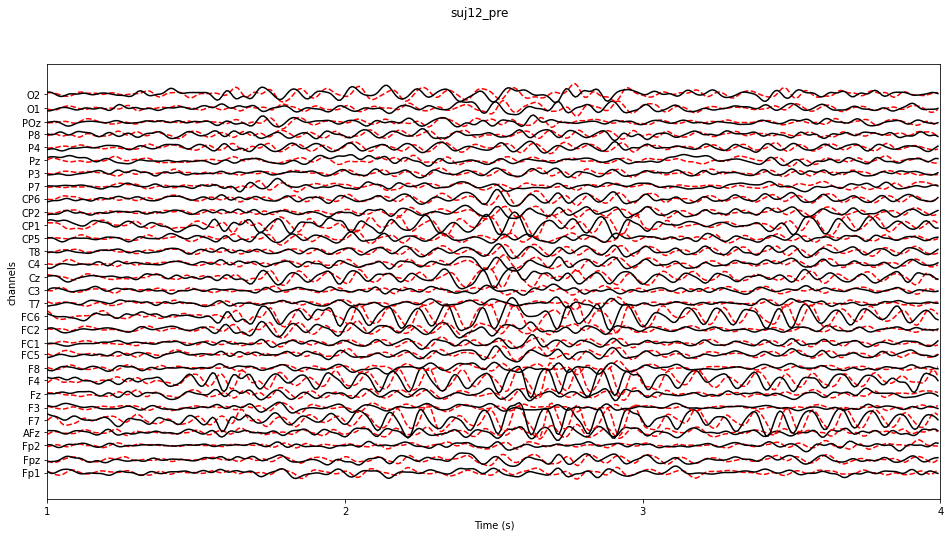

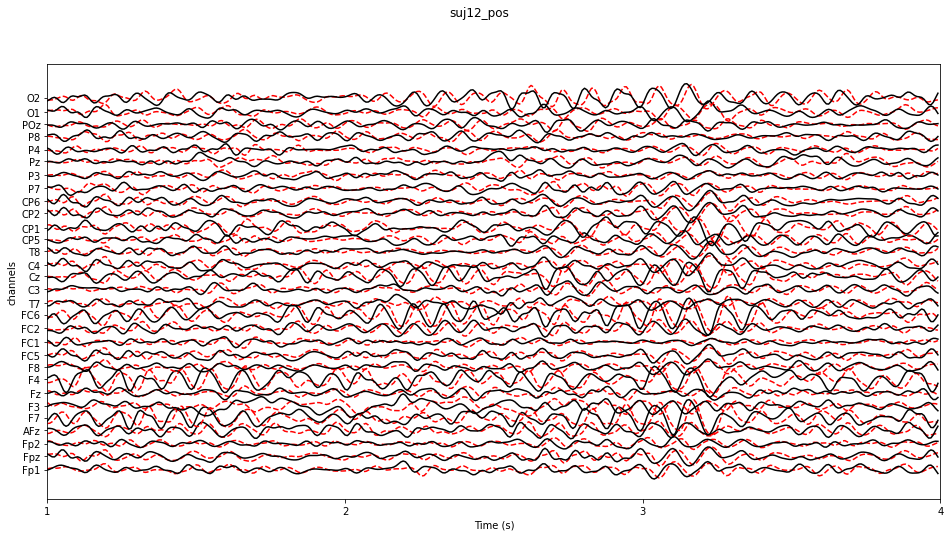

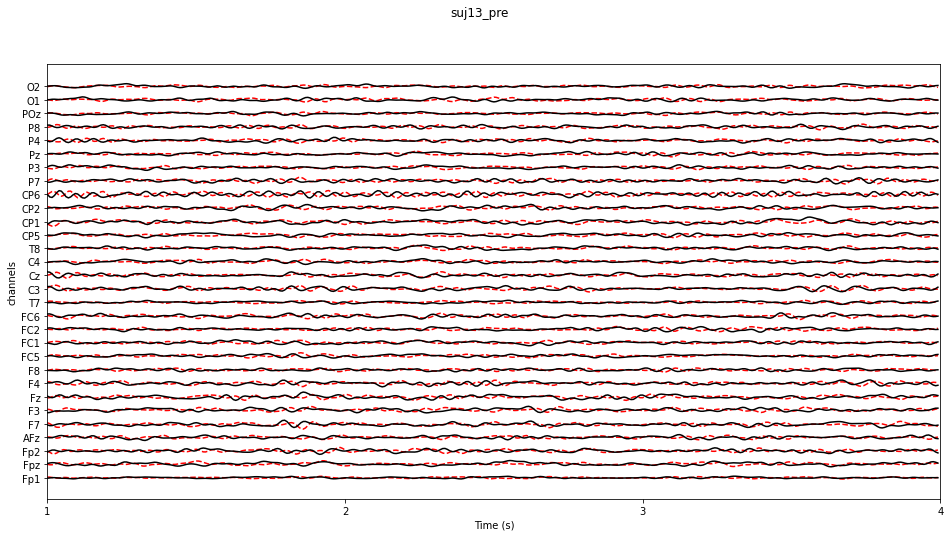

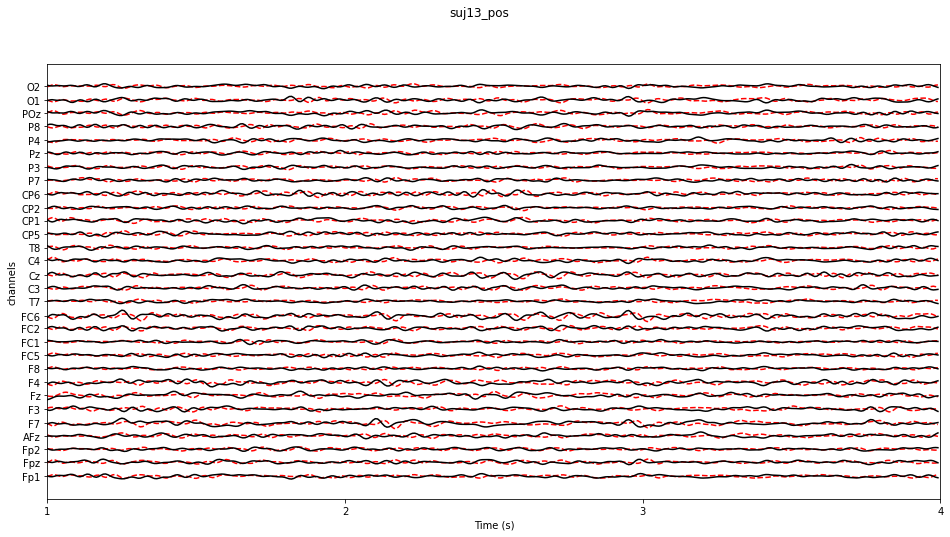

In [ ]:
inicio = 1
fin    = 4
xticks = np.arange(inicio*srate,(fin+1)*srate,srate)
fig,ax = plt.subplots(ncols=1,figsize=(16,8))
fig.suptitle('suj8_pre')
yticks=[]
for c in np.arange(ch):
    temp = suj8_pre_filt[c,inicio*srate:fin*srate]
    temp2=suj8_pre[c,inicio*srate:fin*srate]
    dmin=np.min(temp)
    dmax=np.max(temp)
    vmedio = np.mean([dmin,dmax])+30*c
    yticks.append(vmedio)
    ax.plot(np.arange(inicio*srate,fin*srate),vmedio*np.ones_like(temp)+temp,'--r')
    ax.plot(np.arange(inicio*srate,fin*srate),vmedio*np.ones_like(temp2)+temp2,'k')
ax.set_xlim([inicio*srate,fin*srate])
ax.set_xticks(xticks)
ax.set_xticklabels(np.arange(inicio,fin+1))
ax.set_yticks(yticks)
ax.set_yticklabels(mont1020_30.ch_names)
ax.set_ylabel('channels')
ax.set_xlabel('Time (s)')
  
plt.show()


inicio = 1
fin    = 4
xticks = np.arange(inicio*srate,(fin+1)*srate,srate)
fig,ax = plt.subplots(ncols=1,figsize=(16,8))
fig.suptitle('suj8_pos')
yticks=[]
for c in np.arange(ch):
    temp = suj8_pos_filt[c,inicio*srate:fin*srate]
    temp2=suj8_pos[c,inicio*srate:fin*srate]
    dmin=np.min(temp)
    dmax=np.max(temp)
    vmedio = np.mean([dmin,dmax])+30*c
    yticks.append(vmedio)
    ax.plot(np.arange(inicio*srate,fin*srate),vmedio*np.ones_like(temp)+temp,'--r')
    ax.plot(np.arange(inicio*srate,fin*srate),vmedio*np.ones_like(temp2)+temp2,'k')
ax.set_xlim([inicio*srate,fin*srate])
ax.set_xticks(xticks)
ax.set_xticklabels(np.arange(inicio,fin+1))
ax.set_yticks(yticks)
ax.set_yticklabels(mont1020_30.ch_names)
ax.set_ylabel('channels')
ax.set_xlabel('Time (s)')
  
plt.show()


inicio = 1
fin    = 4
xticks = np.arange(inicio*srate,(fin+1)*srate,srate)
fig,ax = plt.subplots(ncols=1,figsize=(16,8))
fig.suptitle('suj9_pre')
yticks=[]
for c in np.arange(ch):
    temp = suj9_pre_filt[c,inicio*srate:fin*srate]
    temp2=suj9_pre[c,inicio*srate:fin*srate]
    dmin=np.min(temp)
    dmax=np.max(temp)
    vmedio = np.mean([dmin,dmax])+30*c
    yticks.append(vmedio)
    ax.plot(np.arange(inicio*srate,fin*srate),vmedio*np.ones_like(temp)+temp,'--r')
    ax.plot(np.arange(inicio*srate,fin*srate),vmedio*np.ones_like(temp2)+temp2,'k')
ax.set_xlim([inicio*srate,fin*srate])
ax.set_xticks(xticks)
ax.set_xticklabels(np.arange(inicio,fin+1))
ax.set_yticks(yticks)
ax.set_yticklabels(mont1020_30.ch_names)
ax.set_ylabel('channels')
ax.set_xlabel('Time (s)')
  
plt.show()


inicio = 1
fin    = 4
xticks = np.arange(inicio*srate,(fin+1)*srate,srate)
fig,ax = plt.subplots(ncols=1,figsize=(16,8))
fig.suptitle('suj9_pos')
yticks=[]
for c in np.arange(ch):
    temp = suj9_pos_filt[c,inicio*srate:fin*srate]
    temp2=suj9_pos[c,inicio*srate:fin*srate]
    dmin=np.min(temp)
    dmax=np.max(temp)
    vmedio = np.mean([dmin,dmax])+30*c
    yticks.append(vmedio)
    ax.plot(np.arange(inicio*srate,fin*srate),vmedio*np.ones_like(temp)+temp,'--r')
    ax.plot(np.arange(inicio*srate,fin*srate),vmedio*np.ones_like(temp2)+temp2,'k')
ax.set_xlim([inicio*srate,fin*srate])
ax.set_xticks(xticks)
ax.set_xticklabels(np.arange(inicio,fin+1))
ax.set_yticks(yticks)
ax.set_yticklabels(mont1020_30.ch_names)
ax.set_ylabel('channels')
ax.set_xlabel('Time (s)')
  
plt.show()


inicio = 1
fin    = 4
xticks = np.arange(inicio*srate,(fin+1)*srate,srate)
fig,ax = plt.subplots(ncols=1,figsize=(16,8))
fig.suptitle('suj10_pre')
yticks=[]
for c in np.arange(ch):
    temp = suj10_pre_filt[c,inicio*srate:fin*srate]
    temp2=suj10_pre[c,inicio*srate:fin*srate]
    dmin=np.min(temp)
    dmax=np.max(temp)
    vmedio = np.mean([dmin,dmax])+30*c
    yticks.append(vmedio)
    ax.plot(np.arange(inicio*srate,fin*srate),vmedio*np.ones_like(temp)+temp,'--r')
    ax.plot(np.arange(inicio*srate,fin*srate),vmedio*np.ones_like(temp2)+temp2,'k')
ax.set_xlim([inicio*srate,fin*srate])
ax.set_xticks(xticks)
ax.set_xticklabels(np.arange(inicio,fin+1))
ax.set_yticks(yticks)
ax.set_yticklabels(mont1020_30.ch_names)
ax.set_ylabel('channels')
ax.set_xlabel('Time (s)')
  
plt.show()


inicio = 1
fin    = 4
xticks = np.arange(inicio*srate,(fin+1)*srate,srate)
fig,ax = plt.subplots(ncols=1,figsize=(16,8))
fig.suptitle('suj10_pos')
yticks=[]
for c in np.arange(ch):
    temp = suj10_pos_filt[c,inicio*srate:fin*srate]
    temp2=suj10_pos[c,inicio*srate:fin*srate]
    dmin=np.min(temp)
    dmax=np.max(temp)
    vmedio = np.mean([dmin,dmax])+30*c
    yticks.append(vmedio)
    ax.plot(np.arange(inicio*srate,fin*srate),vmedio*np.ones_like(temp)+temp,'--r')
    ax.plot(np.arange(inicio*srate,fin*srate),vmedio*np.ones_like(temp2)+temp2,'k')
ax.set_xlim([inicio*srate,fin*srate])
ax.set_xticks(xticks)
ax.set_xticklabels(np.arange(inicio,fin+1))
ax.set_yticks(yticks)
ax.set_yticklabels(mont1020_30.ch_names)
ax.set_ylabel('channels')
ax.set_xlabel('Time (s)')
  
plt.show()


inicio = 1
fin    = 4
xticks = np.arange(inicio*srate,(fin+1)*srate,srate)
fig,ax = plt.subplots(ncols=1,figsize=(16,8))
fig.suptitle('suj12_pre')
yticks=[]
for c in np.arange(ch):
    temp = suj12_pre_filt[c,inicio*srate:fin*srate]
    temp2=suj12_pre[c,inicio*srate:fin*srate]
    dmin=np.min(temp)
    dmax=np.max(temp)
    vmedio = np.mean([dmin,dmax])+30*c
    yticks.append(vmedio)
    ax.plot(np.arange(inicio*srate,fin*srate),vmedio*np.ones_like(temp)+temp,'--r')
    ax.plot(np.arange(inicio*srate,fin*srate),vmedio*np.ones_like(temp2)+temp2,'k')
ax.set_xlim([inicio*srate,fin*srate])
ax.set_xticks(xticks)
ax.set_xticklabels(np.arange(inicio,fin+1))
ax.set_yticks(yticks)
ax.set_yticklabels(mont1020_30.ch_names)
ax.set_ylabel('channels')
ax.set_xlabel('Time (s)')
  
plt.show()


inicio = 1
fin    = 4
xticks = np.arange(inicio*srate,(fin+1)*srate,srate)
fig,ax = plt.subplots(ncols=1,figsize=(16,8))
fig.suptitle('suj12_pos')
yticks=[]
for c in np.arange(ch):
    temp = suj12_pos_filt[c,inicio*srate:fin*srate]
    temp2=suj12_pos[c,inicio*srate:fin*srate]
    dmin=np.min(temp)
    dmax=np.max(temp)
    vmedio = np.mean([dmin,dmax])+30*c
    yticks.append(vmedio)
    ax.plot(np.arange(inicio*srate,fin*srate),vmedio*np.ones_like(temp)+temp,'--r')
    ax.plot(np.arange(inicio*srate,fin*srate),vmedio*np.ones_like(temp2)+temp2,'k')
ax.set_xlim([inicio*srate,fin*srate])
ax.set_xticks(xticks)
ax.set_xticklabels(np.arange(inicio,fin+1))
ax.set_yticks(yticks)
ax.set_yticklabels(mont1020_30.ch_names)
ax.set_ylabel('channels')
ax.set_xlabel('Time (s)')
  
plt.show()


inicio = 1
fin    = 4
xticks = np.arange(inicio*srate,(fin+1)*srate,srate)
fig,ax = plt.subplots(ncols=1,figsize=(16,8))
fig.suptitle('suj13_pre')
yticks=[]
for c in np.arange(ch):
    temp = suj13_pre_filt[c,inicio*srate:fin*srate]
    temp2=suj13_pre[c,inicio*srate:fin*srate]
    dmin=np.min(temp)
    dmax=np.max(temp)
    vmedio = np.mean([dmin,dmax])+30*c
    yticks.append(vmedio)
    ax.plot(np.arange(inicio*srate,fin*srate),vmedio*np.ones_like(temp)+temp,'--r')
    ax.plot(np.arange(inicio*srate,fin*srate),vmedio*np.ones_like(temp2)+temp2,'k')
ax.set_xlim([inicio*srate,fin*srate])
ax.set_xticks(xticks)
ax.set_xticklabels(np.arange(inicio,fin+1))
ax.set_yticks(yticks)
ax.set_yticklabels(mont1020_30.ch_names)
ax.set_ylabel('channels')
ax.set_xlabel('Time (s)')
  
plt.show()


inicio = 1
fin    = 4
xticks = np.arange(inicio*srate,(fin+1)*srate,srate)
fig,ax = plt.subplots(ncols=1,figsize=(16,8))
fig.suptitle('suj13_pos')
yticks=[]
for c in np.arange(ch):
    temp = suj13_pos_filt[c,inicio*srate:fin*srate]
    temp2=suj13_pos[c,inicio*srate:fin*srate]
    dmin=np.min(temp)
    dmax=np.max(temp)
    vmedio = np.mean([dmin,dmax])+30*c
    yticks.append(vmedio)
    ax.plot(np.arange(inicio*srate,fin*srate),vmedio*np.ones_like(temp)+temp,'--r')
    ax.plot(np.arange(inicio*srate,fin*srate),vmedio*np.ones_like(temp2)+temp2,'k')
ax.set_xlim([inicio*srate,fin*srate])
ax.set_xticks(xticks)
ax.set_xticklabels(np.arange(inicio,fin+1))
ax.set_yticks(yticks)
ax.set_yticklabels(mont1020_30.ch_names)
ax.set_ylabel('channels')
ax.set_xlabel('Time (s)')
  
plt.show()

Text(0.5, 0, 'Time (s)')

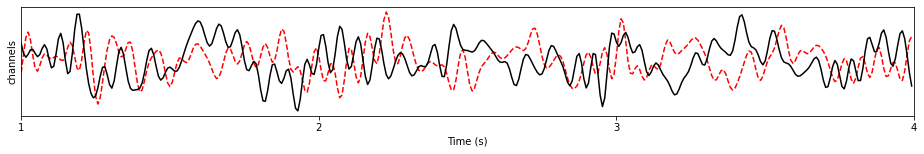

In [ ]:
fig,ax=plt.subplots(ncols=1,figsize=(16,2))
ax.plot(np.arange(inicio*srate,fin*srate),vmedio*np.ones_like(temp)+temp,'--r')
ax.plot(np.arange(inicio*srate,fin*srate),vmedio*np.ones_like(temp2)+temp2,'k')
ax.set_xlim([inicio*srate,fin*srate])
ax.set_xticks(xticks)
ax.set_xticklabels(np.arange(inicio,fin+1))
ax.set_yticks([860])
ax.set_yticklabels(mont1020_30.ch_names[c-1])
ax.set_ylabel('channels')
ax.set_xlabel('Time (s)')





**Graficar los promedios de la topografía para cada participante. ¿Hay diferencias entre
los dos períodos de reposo?**

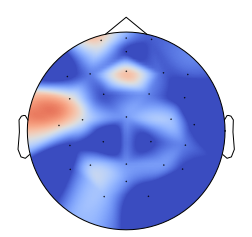

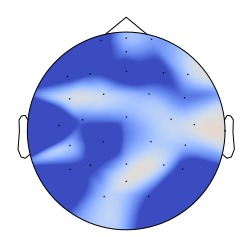

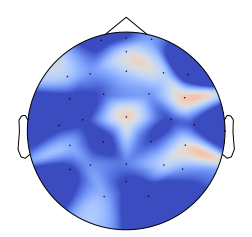

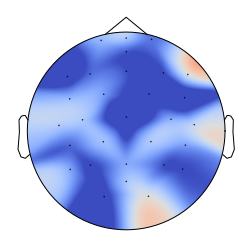

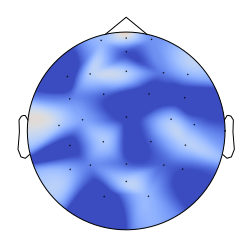

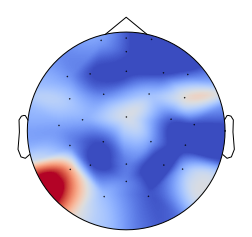

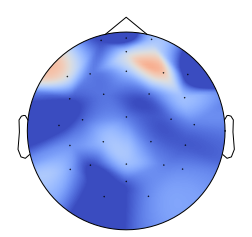

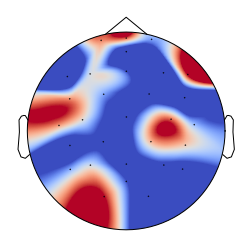

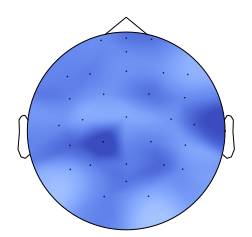

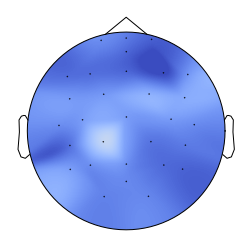

In [ ]:
#Topología

fig, ax = plt.subplots( figsize=(8, 4), gridspec_kw=dict(top=0.9),
                       sharex=True, sharey=True)


im,cm   = mne.viz.plot_topomap(suj8_pre_filt[:,inicio*srate:fin*srate].mean(axis=1),info_eeg,vmin=-0.05,vmax=0.3,
                     cmap='coolwarm', contours=0, show=True)
ax.set_title('topografía promedio suj8_pre')
ax_x_start = 0.95
ax_x_width = 0.04
ax_y_start = 0.1
ax_y_height = 0.9
cbar_ax = fig.add_axes([ax_x_start, ax_y_start, ax_x_width, ax_y_height])
clb = fig.colorbar(im, cax=cbar_ax)
    #clb.ax.set_title(unit_label,fontsize=fontsize) # title on top of colorbar
   # plt.show() 


fig, ax = plt.subplots( figsize=(8, 4), gridspec_kw=dict(top=0.9),
                       sharex=True, sharey=True)


im,cm   = mne.viz.plot_topomap(suj8_pos_filt[:,inicio*srate:fin*srate].mean(axis=1),info_eeg,vmin=-0.05,vmax=0.3,
                     cmap='coolwarm', contours=0, show=True)
ax.set_title('topografía promedio suj8_pos')
ax_x_start = 0.95
ax_x_width = 0.04
ax_y_start = 0.1
ax_y_height = 0.9
cbar_ax = fig.add_axes([ax_x_start, ax_y_start, ax_x_width, ax_y_height])
clb = fig.colorbar(im, cax=cbar_ax)
    #clb.ax.set_title(unit_label,fontsize=fontsize) # title on top of colorbar
   # plt.show() 


fig, ax = plt.subplots( figsize=(8, 4), gridspec_kw=dict(top=0.9),
                       sharex=True, sharey=True)


im,cm   = mne.viz.plot_topomap(suj9_pre_filt[:,inicio*srate:fin*srate].mean(axis=1),info_eeg,vmin=-0.05,vmax=0.3,
                     cmap='coolwarm', contours=0, show=True)
ax.set_title('topogragía promedio suj9_pre')
ax_x_start = 0.95
ax_x_width = 0.04
ax_y_start = 0.1
ax_y_height = 0.9
cbar_ax = fig.add_axes([ax_x_start, ax_y_start, ax_x_width, ax_y_height])
clb = fig.colorbar(im, cax=cbar_ax)
    #clb.ax.set_title(unit_label,fontsize=fontsize) # title on top of colorbar
   # plt.show() 

fig, ax = plt.subplots( figsize=(8, 4), gridspec_kw=dict(top=0.9),
                       sharex=True, sharey=True)


im,cm   = mne.viz.plot_topomap(suj9_pos_filt[:,inicio*srate:fin*srate].mean(axis=1),info_eeg,vmin=-0.05,vmax=0.3,
                     cmap='coolwarm', contours=0, show=True)
ax.set_title('topogragía promedio suj9_pos')
ax_x_start = 0.95
ax_x_width = 0.04
ax_y_start = 0.1
ax_y_height = 0.9
cbar_ax = fig.add_axes([ax_x_start, ax_y_start, ax_x_width, ax_y_height])
clb = fig.colorbar(im, cax=cbar_ax)
    #clb.ax.set_title(unit_label,fontsize=fontsize) # title on top of colorbar
   # plt.show() 

fig, ax = plt.subplots( figsize=(8, 4), gridspec_kw=dict(top=0.9),
                       sharex=True, sharey=True)


im,cm   = mne.viz.plot_topomap(suj10_pre_filt[:,inicio*srate:fin*srate].mean(axis=1),info_eeg,vmin=-0.05,vmax=0.3,
                     cmap='coolwarm', contours=0, show=True)
ax.set_title('topogragía promedio suj10_pre')
ax_x_start = 0.95
ax_x_width = 0.04
ax_y_start = 0.1
ax_y_height = 0.9
cbar_ax = fig.add_axes([ax_x_start, ax_y_start, ax_x_width, ax_y_height])
clb = fig.colorbar(im, cax=cbar_ax)
    #clb.ax.set_title(unit_label,fontsize=fontsize) # title on top of colorbar
   # plt.show() 

fig, ax = plt.subplots( figsize=(8, 4), gridspec_kw=dict(top=0.9),
                       sharex=True, sharey=True)


im,cm   = mne.viz.plot_topomap(suj10_pos_filt[:,inicio*srate:fin*srate].mean(axis=1),info_eeg,vmin=-0.05,vmax=0.3,
                     cmap='coolwarm', contours=0, show=True)
ax.set_title('topogragía promedio suj10_pos')
ax_x_start = 0.95
ax_x_width = 0.04
ax_y_start = 0.1
ax_y_height = 0.9
cbar_ax = fig.add_axes([ax_x_start, ax_y_start, ax_x_width, ax_y_height])
clb = fig.colorbar(im, cax=cbar_ax)
    #clb.ax.set_title(unit_label,fontsize=fontsize) # title on top of colorbar
   # plt.show() 

fig, ax = plt.subplots( figsize=(8, 4), gridspec_kw=dict(top=0.9),
                       sharex=True, sharey=True)


im,cm   = mne.viz.plot_topomap(suj12_pre_filt[:,inicio*srate:fin*srate].mean(axis=1),info_eeg,vmin=-0.05,vmax=0.3,
                     cmap='coolwarm', contours=0, show=True)
ax.set_title('topogragía promedio suj12_pre')
ax_x_start = 0.95
ax_x_width = 0.04
ax_y_start = 0.1
ax_y_height = 0.9
cbar_ax = fig.add_axes([ax_x_start, ax_y_start, ax_x_width, ax_y_height])
clb = fig.colorbar(im, cax=cbar_ax)
    #clb.ax.set_title(unit_label,fontsize=fontsize) # title on top of colorbar
   # plt.show() 

fig, ax = plt.subplots( figsize=(8, 4), gridspec_kw=dict(top=0.9),
                       sharex=True, sharey=True)


im,cm   = mne.viz.plot_topomap(suj12_pos_filt[:,inicio*srate:fin*srate].mean(axis=1),info_eeg,vmin=-0.05,vmax=0.3,
                     cmap='coolwarm', contours=0, show=True)
ax.set_title('topogragía promedio suj12_pos')
ax_x_start = 0.95
ax_x_width = 0.04
ax_y_start = 0.1
ax_y_height = 0.9
cbar_ax = fig.add_axes([ax_x_start, ax_y_start, ax_x_width, ax_y_height])
clb = fig.colorbar(im, cax=cbar_ax)
    #clb.ax.set_title(unit_label,fontsize=fontsize) # title on top of colorbar
   # plt.show() 

fig, ax = plt.subplots( figsize=(8, 4), gridspec_kw=dict(top=0.9),
                       sharex=True, sharey=True)


im,cm   = mne.viz.plot_topomap(suj13_pre_filt[:,inicio*srate:fin*srate].mean(axis=1),info_eeg,vmin=-0.05,vmax=0.3,
                     cmap='coolwarm', contours=0, show=True)
ax.set_title('topogragía promedio suj13_pre')
ax_x_start = 0.95
ax_x_width = 0.04
ax_y_start = 0.1
ax_y_height = 0.9
cbar_ax = fig.add_axes([ax_x_start, ax_y_start, ax_x_width, ax_y_height])
clb = fig.colorbar(im, cax=cbar_ax)
    #clb.ax.set_title(unit_label,fontsize=fontsize) # title on top of colorbar
   # plt.show() 

fig, ax = plt.subplots( figsize=(8, 4), gridspec_kw=dict(top=0.9),
                       sharex=True, sharey=True)


im,cm   = mne.viz.plot_topomap(suj13_pos_filt[:,inicio*srate:fin*srate].mean(axis=1),info_eeg,vmin=-0.05,vmax=0.3,
                     cmap='coolwarm', contours=0, show=True)
ax.set_title('topogragía promedio suj13_pos')
ax_x_start = 0.95
ax_x_width = 0.04
ax_y_start = 0.1
ax_y_height = 0.9
cbar_ax = fig.add_axes([ax_x_start, ax_y_start, ax_x_width, ax_y_height])
clb = fig.colorbar(im, cax=cbar_ax)
    #clb.ax.set_title(unit_label,fontsize=fontsize) # title on top of colorbar
   # plt.show() 


 **Calcular las componentes principales para el total de los datos (concatenados en el
tiempo). ¿Qué peso tiene cada proyección en los distintos períodos de reposo?**

In [ ]:
# Montage 10-20
mont1020 = mne.channels.make_standard_montage('standard_1020')
# Elijo canales que tengo
#kept_channels = ['Fp1', 'Fp2', 'F3', 'F4', 'C3', 'C4', 'P3', 'P4', 'O1', 'O2', 'F7', 'F8', 
                # 'T7', 'T8', 'P7', 'P8', 'Fz', 'Cz', 'Pz', 'FC1', 'FC2',
                 #'FC5', 'FC6','CP1','CP2','CP5','CP6','AFz','Fpz','POz']

#ind = [i for (i, channel) in enumerate(mont1020.ch_names) if channel in kept_channels]
#mont1020_30 = mont1020.copy()
# Me quedo solo con los canales seleccionados
#mont1020_30.ch_names = [mont1020.ch_names[x] for x in ind]
#kept_channel_info = [mont1020.dig[x+3] for x in ind]
# Me quedo con las referencias desde dónde están ubicados los canales
#mont1020_30.dig = mont1020.dig[0:3]+kept_channel_info
info_eeg = mne.create_info(ch_names=mont1020.ch_names, sfreq=128,
                            ch_types='eeg').set_montage(mont1020)

(300, 3)


ValueError: ignored

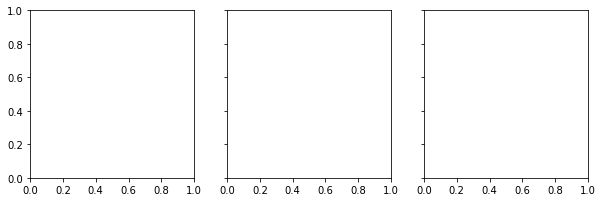

In [ ]:
filename = '/content/drive/MyDrive/procesados/suj_8_bl_1.txt'
suj8_pre = pd.read_csv(filename, sep=',', header=None)
filename = '/content/drive/MyDrive/procesados/suj_8_bl_2.txt'
suj8_pos = pd.read_csv(filename, sep=',', header=None)
filename = '/content/drive/MyDrive/procesados/suj_9_bl_1.txt'
suj9_pre = pd.read_csv(filename, sep=',', header=None)
filename = '/content/drive/MyDrive/procesados/suj_9_bl_2.txt'
suj9_pos = pd.read_csv(filename, sep=',', header=None)
filename = '/content/drive/MyDrive/procesados/suj_10_bl_1.txt'
suj10_pre = pd.read_csv(filename, sep=',', header=None)
filename = '/content/drive/MyDrive/procesados/suj_10_bl_2.txt'
suj10_pos = pd.read_csv(filename, sep=',', header=None)
filename = '/content/drive/MyDrive/procesados/suj_12_bl_1.txt'
suj12_pre = pd.read_csv(filename, sep=',', header=None)
filename = '/content/drive/MyDrive/procesados/suj_12_bl_2.txt'
suj12_pos = pd.read_csv(filename, sep=',', header=None)
filename = '/content/drive/MyDrive/procesados/suj_13_bl_1.txt'
suj13_pre = pd.read_csv(filename, sep=',', header=None)
filename = '/content/drive/MyDrive/procesados/suj_13_bl_2.txt'
suj13_pos = pd.read_csv(filename, sep=',', header=None)


EEGdata= pd.concat([suj8_pre, suj8_pos, suj9_pre, suj9_pos,suj10_pre, suj10_pos,suj12_pre, suj12_pos,suj13_pre, suj13_pos])
EEGdata= EEGdata.to_numpy()

pca = decomposition.PCA(n_components=3)
pca.fit(EEGdata)
pcs = pca.transform(EEGdata)
print(pcs.shape)
var = pca.explained_variance_ratio_
fig2, ax = plt.subplots(ncols=pcs.shape[1], figsize=(10, 3), gridspec_kw=dict(top=0.9),
                       sharex=True, sharey=True)
for p in range(pcs.shape[1]):
  mne.viz.plot_topomap(pcs[:,p],
                    info_eeg,
                    cmap='coolwarm', contours=0,
                    axes=ax[p],show=False)
  ax[p].set_title('var:'+str(round(var[p]*100,2)) ) 

**Referenciar los datos al promedio por sample.**

**Calcular el Campo de Potencia Global (GFP, [1]) dado por:
GF Pu =
q
(
Pn
i=1 u
2
i
n
)
Encontrar los picos del GFP. Guardar los vectores del GFP para los máximos encontrados.**

In [11]:
!git clone https://github.com/faopazo/DM_CyT.git

Cloning into 'DM_CyT'...
fatal: could not read Username for 'https://github.com': No such device or address


In [12]:
cd DM_CyT

[Errno 2] No such file or directory: 'DM_CyT'
/content


In [13]:
!git config --global user.email "opazoayelen@gmail.com"
!git config --global user.name "faopazo"

In [14]:
!git commit -m 'preentrega_v1'

fatal: not a git repository (or any of the parent directories): .git


In [15]:
!git push 

fatal: not a git repository (or any of the parent directories): .git
